In [1]:
suppressPackageStartupMessages({
    library(cluster)
    library(data.table)
    library(dplyr)
    library(gdata)
    library(ggalluvial)
    library(ggbeeswarm)
    library(ggplot2)
    library(ggpointdensity)
    library(ggrepel)
    library(ggsci)
    library(ggthemes)
    library(glmnet)
    library(glue)
    library(grid)
    library(gridExtra)
    library(harmony)
    library(irlba)
    library(janitor)
    library(lisi)
    library(lme4)
    library(magrittr)
    library(MASS)
    library(matrixStats)
    library(monocle3)
    library(patchwork)
    library(plyr)
    library(presto)
    library(rcna)
    library(RColorBrewer)
    library(reticulate)
    library(rstatix)
    library(Seurat)
    library(stringr)
    library(tidyverse)
    library(uwot)
    library(viridis)
    library(ComplexHeatmap)
    library(parallel)
    library(scico)
    library(rpart)
    library(partykit)
    library(ggparty)
    library(xgboost)
    library(caret)
    library(scCustomize)
    library(scDblFinder)
    library(symphony)
    
    require(gdata)
    library(readxl)
    library(dplyr)
    library(patchwork)
    library(presto)
    library(uwot)
    library(harmony)
    library(magrittr)
    library(gridExtra)
    library(reticulate)
    library(ggbeeswarm)
    library(ggrepel)
    library(plyr)
    library(ggplot2)
    library(gridExtra)
    library(RColorBrewer)
    library(MASS)
    library(matrixStats)
    library(viridis)
    library(grid)
    library(singlecellmethods)
    library(umap)
    library(tidyverse)
    library(ggpubr)
    library(rstatix)
    library(Seurat)
    library(CCA)
    library(tidyverse)
    library(ggthemes)
    library(symphony)
    library(pheatmap)
    library(ggrastr)
})


setDTthreads(threads = 8)
print(getDTthreads(verbose = getOption("datatable.verbose"))) # check

source("/home/jinamo@xsede.org/scripts/cytof/Seurat_functions.R")
source("/home/jinamo@xsede.org/scripts/cytof/cytofAsinh.R")
source("/home/jinamo@xsede.org/scripts/cytof/MASC.R")

FUN <- function(x, n, frac) {
    min_byFrac = as.integer(length(x)*frac)
    if (as.integer(length(x)) <= n) {
        return(x)
    } else if (as.integer(length(x)) > n & min_byFrac <= n) {
        return(x[x %in% sample(x, n)])
    } else if (as.integer(length(x)) > n & min_byFrac > n) {
        return(x[x %in% sample(x, min_byFrac)])
    }
}

get_density <- function(x, y, ...) {
  dens <- MASS::kde2d(x, y, ...)
  ix <- findInterval(x, dens$x)
  iy <- findInterval(y, dens$y)
  ii <- cbind(ix, iy)
  return(dens$z[ii])
}

celltype="T"

manual_colors = c(
  "0" = "#E41A1C",
  "1" = "#377EB8",
  "2" = "#4DAF4A",
  "3" = "#984EA3",
  "4" = "#FF7F00",
  "5" = "#FFFF33",
  "6" = "#A65628",
  "7" = "lightgrey",
  "8" = "#999999",
  "9" = "#66C2A5",
  "10" = "#67000D",
  "11" = "#8DA0CB",
  "12" = "#FFD92F",
  "13" = "#A6D854",
  "14" = "#E78AC3",
  "15" = "#FC8D62",
  "16" = "darkgrey",
  "17" = "#FEB24C",
  "18" = "#377EB8",
  "19" = "lightblue",
  "20" = "#FDE0EF",
  "21" = "#B8E186",
  "22" = "#66C2A5",
  "23" = "#A6D855",
  "24" = "#E78AC4",
  "25" = "#FC8D63",
  "26" = "brown",
  "27" = "#FEB25C",
  "28" = "#377EB9",
  "29" = "lightgreen",
  "30" = "#FDE1EF"
)

[1] 8


## Clustering on the CCA

In [2]:
meta_all = readRDS(paste0("/pl/active/fanzhanglab/jinamo/AMP_RASLE/Phase2/data/CITEseq/qc_mRNA_protein_cca_pca_harmony_umap_clus_meta_all_",celltype,".rds"))
meta_all = meta_all[,-c(21:40, 48:67, 75:94)] # remove results from all cells


In [4]:
meta<- read.table("/projects/jinamo@xsede.org/cytof/data/RA_AtRiskRA_Control_meta.txt",sep="\t",header=TRUE, na.strings=c("","NA")) %>%
    dplyr::mutate(age_at_biopsy = as.integer(age_at_biopsy),
                  diagnosis = factor(diagnosis, levels=c("Control","AtRiskRA","RA")))
    
meta_all = dplyr::left_join(meta_all,meta,by="subject_id")

meta_add = read.table("/projects/jinamo@xsede.org/cytof/data/meta_clinical_RA.txt", header = TRUE, sep = "\t") %>%
  dplyr::mutate(CDAI = as.numeric(CDAI),
                subject_id = gsub("-","_",subject_id),
                treatment = dplyr::case_when(
                  treatment == "1" ~ "naive",
                  treatment == "2" ~ "MTX failure",
                  treatment == "3" ~ "TNF failure",
                  treatment == "4" ~ "OA"
                )) %>%
  dplyr::select(-c(sex))
meta_all = dplyr::left_join(meta_all,meta_add,by="subject_id")

meta_total = read.csv("/projects/jinamo@xsede.org/cytof/data/Total_Metadata.csv") %>%
    dplyr::mutate(subject_id = gsub("-","_",Patient)) %>%
    dplyr::distinct(subject_id,Site,Race)
meta_total = meta_total[!(is.na(meta_total$Race) | meta_total$Race==""), ]
meta_all = dplyr::left_join(meta_all,meta_total,by="subject_id")


Warning message:
“There was 1 warning in `dplyr::mutate()`.
ℹ In argument: `age_at_biopsy = as.integer(age_at_biopsy)`.
Caused by warning:
! NAs introduced by coercion”


In [7]:
meta_all$AtRisk = dplyr::case_when(
  meta_all$AMP_Group == "FDR" & meta_all$CCP == "Positive" ~ "FDR(+)/ACPA(+)",
  meta_all$AMP_Group == "GP" & meta_all$CCP == "Positive" ~ "FDR(-)/ACPA(+)",
  meta_all$AMP_Group == "FDR" & meta_all$CCP == "Negative" ~ "FDR(+)/ACPA(-)",
  meta_all$AMP_Group == "GP" & meta_all$CCP == "Negative" ~ "FDR(-)/ACPA(-)",
  meta_all$diagnosis == "Control" ~ "Control",
  meta_all$diagnosis == "RA" ~ "RA")
meta_all$AtRisk = factor(meta_all$AtRisk,levels=c("Control","FDR(-)/ACPA(-)","FDR(+)/ACPA(-)","FDR(-)/ACPA(+)","FDR(+)/ACPA(+)","RA"))
meta_all$disease = dplyr::case_when(
  meta_all$AtRisk == "FDR(+)/ACPA(+)" | meta_all$AtRisk == "FDR(-)/ACPA(+)" | meta_all$AtRisk == "FDR(+)/ACPA(-)" ~ "AtRiskRA",
  meta_all$AtRisk == "Control" | meta_all$AtRisk == "FDR(-)/ACPA(-)" ~ "Control",
  meta_all$AtRisk == "RA" ~ "RA")
meta_all$disease = factor(meta_all$disease,levels=c("Control","AtRiskRA","RA"))
meta_all$age_at_biopsy <- as.numeric(meta_all$age_at_biopsy)
meta_all$sex <- as.numeric(factor(meta_all$sex, c('female', 'male')))
meta_all$ethnicity <- as.numeric(factor(meta_all$ethnicity, c('not_hispanic', 'hispanic_latino')))
meta_all$AMP_Group <- as.numeric(factor(meta_all$AMP_Group, c('GP', 'FDR')))
meta_all$CCP <- dplyr::case_when(
    meta_all$CCP == 'Negative' ~ "at-risk CCP(-)", 
    meta_all$CCP == 'Positive' ~ "at-risk CCP(+)",
    meta_all$AtRisk == "Control" ~ "Control")
meta_all$CCP <- factor(meta_all$CCP,levels=c("Control","at-risk CCP(-)","at-risk CCP(+)"))
meta_all$CCP30_titer <- as.numeric(meta_all$CCP30_titer)
meta_all$CCP31_titer <- as.numeric(meta_all$CCP31_titer)
meta_all$RF <- factor(meta_all$RF, c('Negative', 'Positive'))
meta_all$RF_IgM_titer <- as.numeric(meta_all$RF_IgM_titer)
meta_all$RF_IgG_titer <- as.numeric(meta_all$RF_IgG_titer)
meta_all$RF_IgA_titer <- as.numeric(meta_all$RF_IgA_titer)

meta_all$Site <- dplyr::case_when(
    is.na(meta_all$Site) & meta_all$diagnosis == "RA" ~ meta_all$site, 
    is.na(meta_all$Site) & meta_all$diagnosis == "AtRiskRA" ~ "UCol", 
    TRUE ~ meta_all$Site)

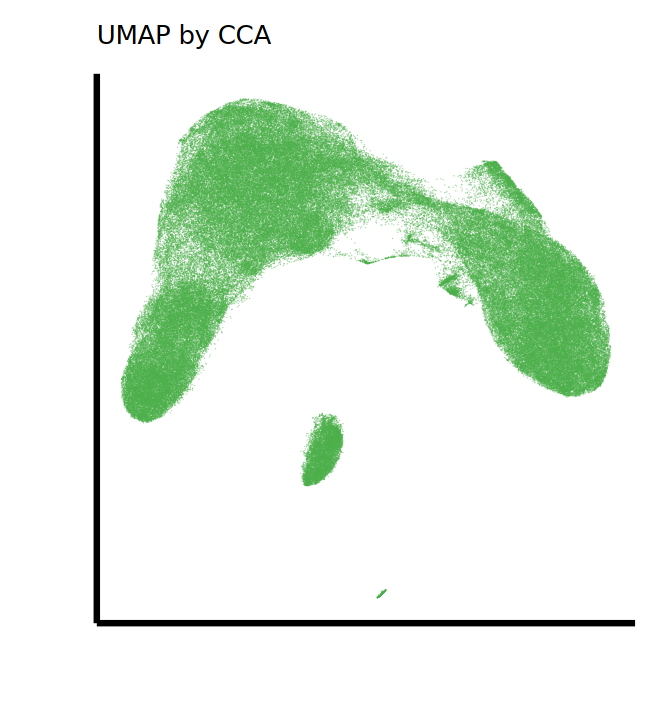

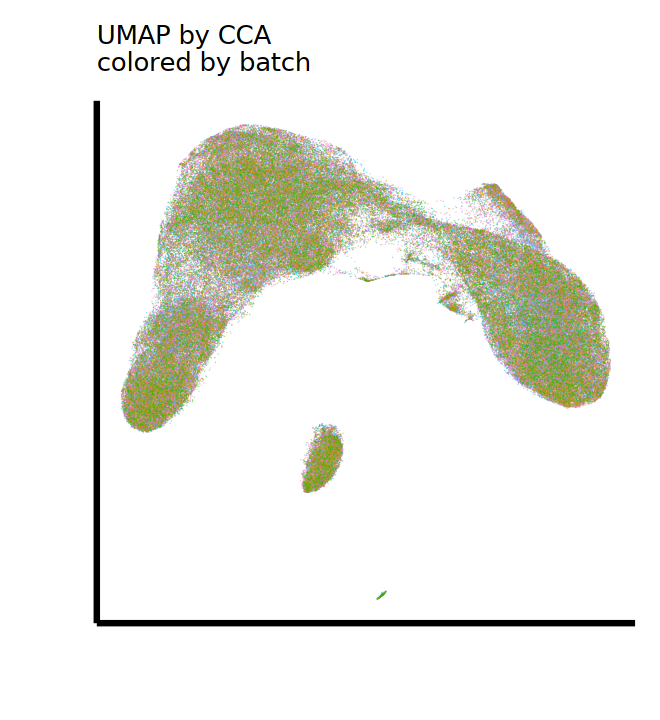

Warning message:
“`funs()` was deprecated in dplyr 0.8.0.
ℹ Please use a list of either functions or lambdas:

# Simple named list: list(mean = mean, median = median)

# Auto named with `tibble::lst()`: tibble::lst(mean, median)

# Using lambdas list(~ mean(., trim = .2), ~ median(., na.rm = TRUE))”


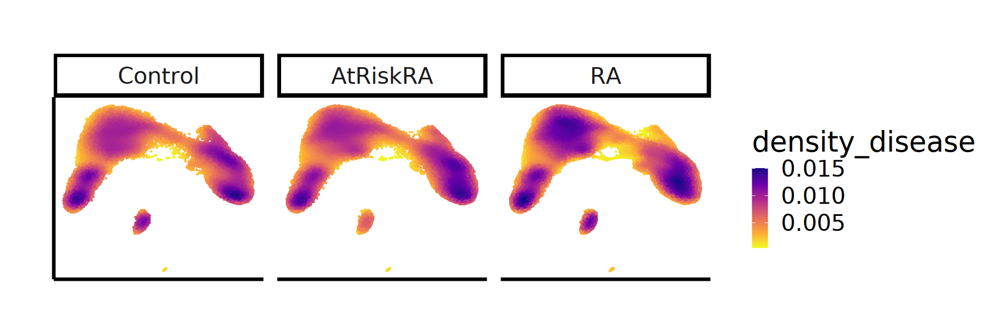

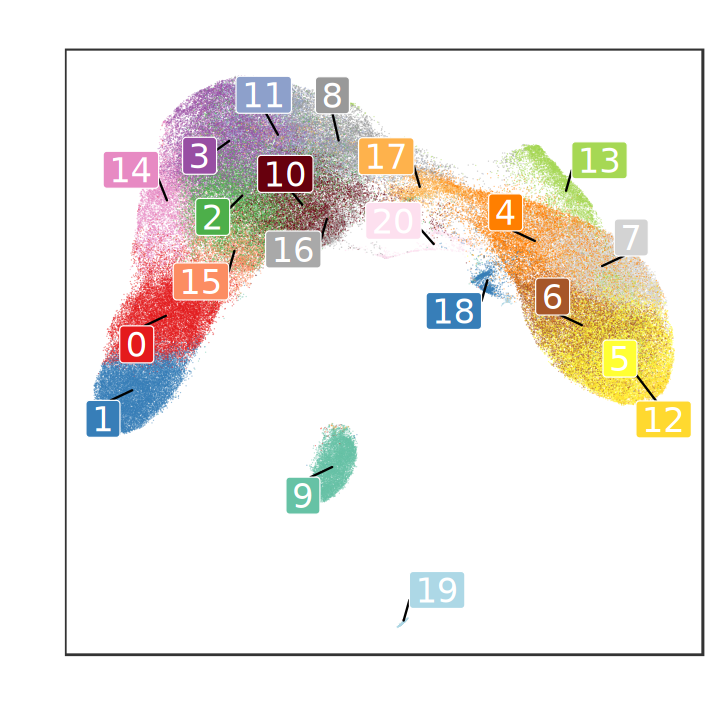

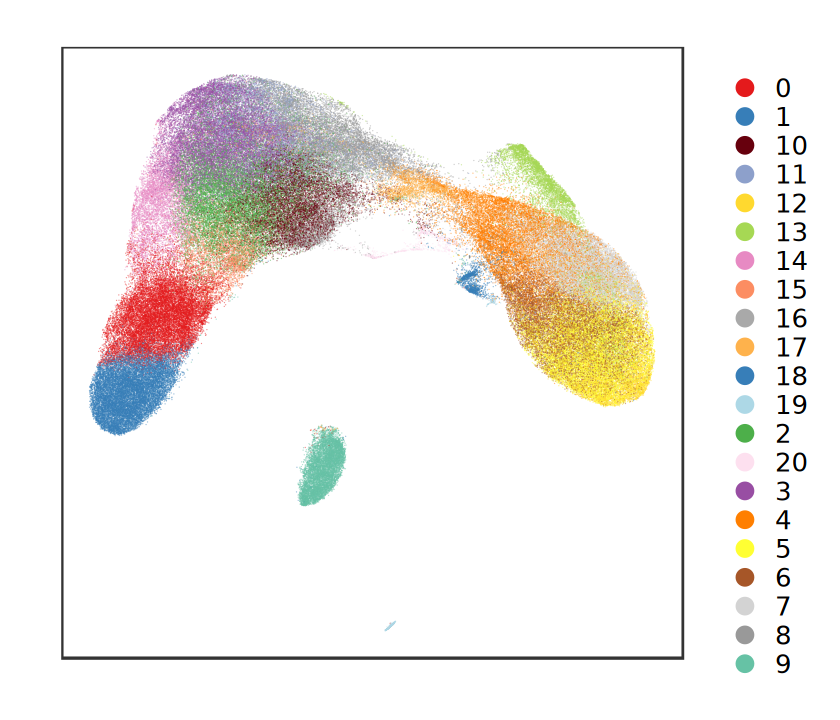

In [14]:

options(repr.plot.height = 6, repr.plot.width = 5.5)
plot(ggplot() +
       geom_point(
         data = meta_all,
         mapping = aes_string(x = "UMAP1_cca", y = "UMAP2_cca"), 
           color = "#4DAF4A",
         size = 0.1, stroke = 0, shape = 16, alpha = 0.5
       ) +
       labs(
         title = paste0("UMAP by CCA"),
         x = "",
         y = ""
       ) +
       theme_classic(base_size = 30) +
       theme(
         legend.position = "none",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=15, face = "italic")
       )
)

options(repr.plot.height = 6, repr.plot.width = 5.5)
plot(ggplot() +
       geom_point(
         data = meta_all,
         mapping = aes_string(x = "UMAP1_cca", y = "UMAP2_cca", color = "batch"),
         size = 0.1, stroke = 0, shape = 16, alpha = 0.5
       ) +
       labs(
         title = paste0("UMAP by CCA\ncolored by batch"),
         x = "",
         y = ""
       ) +
       theme_classic(base_size = 30) +
       theme(
         legend.position = "none",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=15, face = "italic")
       )
)

options(repr.plot.height = 5, repr.plot.width = 15)
plot(ggplot() +
       geom_point(data = meta_all %>%
                            dplyr::group_by(disease) %>%
                            dplyr::mutate(density_disease = get_density(UMAP1_cca, UMAP2_cca, n = 100)) %>%
                            dplyr::ungroup(),
                  aes(UMAP1_cca, UMAP2_cca, color = density_disease),
                  size = 1, stroke = 0, shape = 16) + 
       scale_color_viridis_c(option = "plasma",direction = -1, na.value = "black",
                             # limits = c(0, quantile(.$density_disease, probs = seq(0, 1, 0.01))["98%"])
                            ) +
       facet_wrap( ~ disease, ncol = 3) +
       labs(
         title = "",
         x = "",
         y = ""
       ) +
       theme_classic(base_size = 30) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=30, face = "italic")
       )
)

# Find cluster center
cluster_center <- meta_all %>% 
                   dplyr::mutate(res_cell = factor(res_1.00_cca#,levels=cluster_df$cluster)
                                                  )) %>%
  dplyr::group_by(res_cell) %>%
  dplyr::summarise_at(vars(UMAP1_cca, UMAP2_cca), dplyr::funs(median(., na.rm=TRUE)))
cluster_center <- as.data.frame(cluster_center)
cluster_center$res_cell <- as.character(cluster_center$res_cell)

options(repr.plot.height = 6, repr.plot.width = 6)
plot(ggplot() +
       geom_point(
         data = meta_all %>% 
                   dplyr::mutate(res_cell = factor(res_1.00_cca#,levels=cluster_df$cluster)
                                                  )),
         mapping = aes_string(x = "UMAP1_cca", y = "UMAP2_cca", color = "res_cell"),
         size = 0.1, stroke = 0, shape = 16, alpha = 0.5
       ) +
       geom_label_repel(
         data = cluster_center,
         aes(x = UMAP1_cca, y = UMAP2_cca, label = res_cell, fill = res_cell),
         color = "white",segment.color = "black",
           size = 7,
         min.segment.length = 0, seed = 42, box.padding = 0.5
       ) +
       scale_color_manual(values = c(
         "0" = "#E41A1C",
         "1" = "#377EB8",
         "2" = "#4DAF4A",
         "3" = "#984EA3",
         "4" = "#FF7F00",
         "5" = "#FFFF33",
         "6" = "#A65628",
         "7" = "lightgrey",
         "8" = "#999999",
         "9" = "#66C2A5",
         "10" = "#67000D",
         "11" = "#8DA0CB",
         "12" = "#FFD92F",
         "13" = "#A6D854",
         "14" = "#E78AC3",
         "15" = "#FC8D62",
         "16" = "darkgrey",
         "17" = "#FEB24C",
         "18" = "#377EB8",
         "19" = "lightblue",
         "20" = "#FDE0EF",
         "21" = "#B8E186",
         "22" = "#66C2A5",
         "23" = "#A6D855",
         "24" = "#E78AC4",
         "25" = "#FC8D63",
         "26" = "brown",
         "27" = "#FEB25C",
         "28" = "#377EB9",
         "29" = "lightgreen",
         "30" = "#FDE1EF"
       )) +
       scale_fill_manual(values = c(
         "0" = "#E41A1C",
         "1" = "#377EB8",
         "2" = "#4DAF4A",
         "3" = "#984EA3",
         "4" = "#FF7F00",
         "5" = "#FFFF33",
         "6" = "#A65628",
         "7" = "lightgrey",
         "8" = "#999999",
         "9" = "#66C2A5",
         "10" = "#67000D",
         "11" = "#8DA0CB",
         "12" = "#FFD92F",
         "13" = "#A6D854",
         "14" = "#E78AC3",
         "15" = "#FC8D62",
         "16" = "darkgrey",
         "17" = "#FEB24C",
         "18" = "#377EB8",
         "19" = "lightblue",
         "20" = "#FDE0EF",
         "21" = "#B8E186",
         "22" = "#66C2A5",
         "23" = "#A6D855",
         "24" = "#E78AC4",
         "25" = "#FC8D63",
         "26" = "brown",
         "27" = "#FEB25C",
         "28" = "#377EB9",
         "29" = "lightgreen",
         "30" = "#FDE1EF"
       )) +
       labs(
         x = "",
         y = "",
         title = ""
       ) +
       theme_bw(base_size = 20) +
       theme(
         legend.position = "none",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=10)
       ) 
)

options(repr.plot.height = 6, repr.plot.width = 7)
# png(paste0("/projects/jinamo@xsede.org/cytof/results/T_cells/Clustering_neighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,"_cluster.png"), width = 1400, height = 1400,res=360)
plot(ggplot() +
       geom_point(
         data = meta_all %>% 
                   dplyr::mutate(res_cell = factor(res_1.00_cca#,levels=cluster_df$cluster)
                                                  )),
         mapping = aes_string(x = "UMAP1_cca", y = "UMAP2_cca", color = "res_cell"),
         size = 0.1, stroke = 0, shape = 16, alpha = 0.5
       ) +
       scale_colour_manual(# labels = paste0("T-",cluster_df$cluster,":",cluster_df$res_1.00_cca),
                           values = c(
                             "0" = "#E41A1C",
                             "1" = "#377EB8",
                             "2" = "#4DAF4A",
                             "3" = "#984EA3",
                             "4" = "#FF7F00",
                             "5" = "#FFFF33",
                             "6" = "#A65628",
                             "7" = "lightgrey",
                             "8" = "#999999",
                             "9" = "#66C2A5",
                             "10" = "#67000D",
                             "11" = "#8DA0CB",
                             "12" = "#FFD92F",
                             "13" = "#A6D854",
                             "14" = "#E78AC3",
                             "15" = "#FC8D62",
                             "16" = "darkgrey",
                             "17" = "#FEB24C",
                             "18" = "#377EB8",
                             "19" = "lightblue",
                             "20" = "#FDE0EF",
                             "21" = "#B8E186",
                             "22" = "#66C2A5",
                             "23" = "#A6D855",
                             "24" = "#E78AC4",
                             "25" = "#FC8D63",
                             "26" = "brown",
                             "27" = "#FEB25C",
                             "28" = "#377EB9",
                             "29" = "lightgreen",
                             "30" = "#FDE1EF"
                           )) +
       labs(
         x = "",
         y = "",
         title = ""
       ) +
       theme_bw(base_size = 19) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=10)
       ) + guides(colour = guide_legend(override.aes = list(size=5,
                                                           alpha = 1),
                                        title = "",
                                        ncol = 1))
)

### Expression of proteins on CCA UMAP

In [10]:
adt_exprs_norm_filter <- readRDS(paste0("/pl/active/fanzhanglab/jinamo/AMP_RASLE/Phase2/data/CITEseq/adt_exprs_norm_filter_",celltype,".rds"))


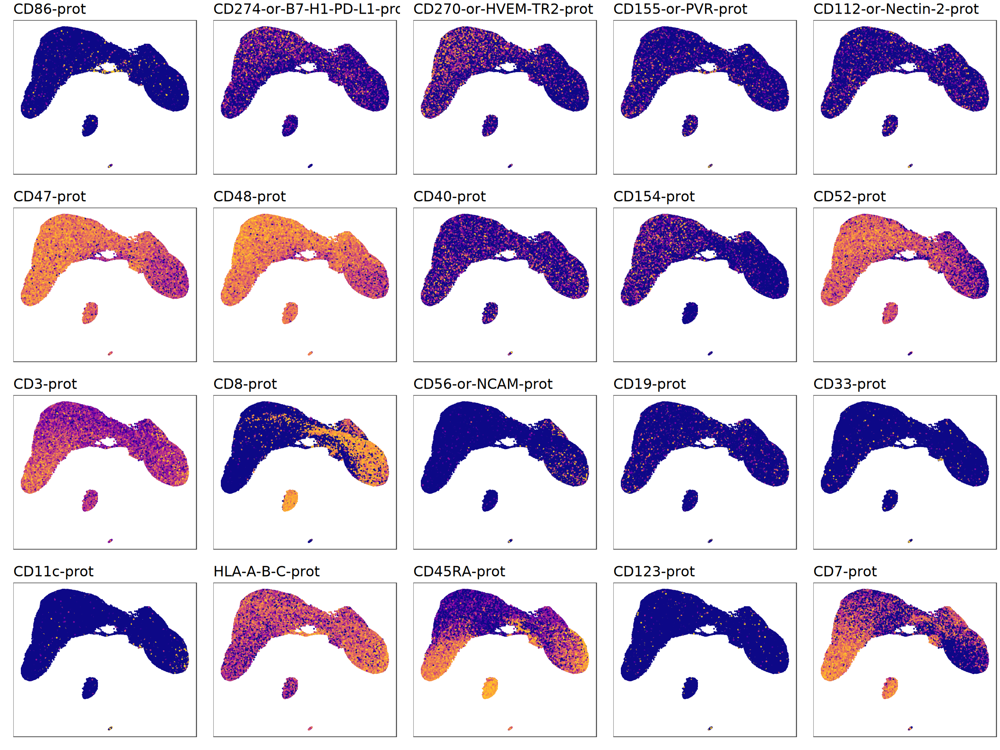

In [19]:

plot_protein <- rownames(adt_exprs_norm_filter)[1:20]

myplots <- list()
for (i in 1:length(plot_protein)) {
  gene <- plot_protein[i]
    
    max.cutoff = quantile(adt_exprs_norm_filter[gene,], .99)
    min.cutoff = quantile(adt_exprs_norm_filter[gene,], .01)

    tmp <- sapply(X = adt_exprs_norm_filter[gene,], FUN = function(x) {
        return(ifelse(test = x > max.cutoff, yes = max.cutoff,
            no = x))
    })
    tmp <- sapply(X = tmp, FUN = function(x) {
        return(ifelse(test = x < min.cutoff, yes = min.cutoff,
            no = x))
    })
  
    meta_all$gene <- as.numeric(tmp)
    

    
   ind <- paste("p", i, sep = "")
   ind <- ggplot(
                 data = meta_all[sample(nrow(meta_all)),],
#                  data = meta_all[order(meta_all$gene),] , 
                 aes(x = UMAP1_cca, y = UMAP2_cca)) + 
      geom_point(mapping = aes(color = gene), size = 0.1) + 
      scale_color_viridis(option = "plasma", end = .9) +
      labs(x="", y="")+
      theme_bw(base_size = 10)+
      theme(
        axis.text = element_blank(),
        axis.ticks = element_blank(),
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=20, face = "italic"), # face="bold.italic"
        legend.position = "none") +
      labs(title = gene)
   myplots[[i]] <- ind
    
    
}

options(repr.plot.height = 15, repr.plot.width = 20)
p <- do.call("grid.arrange", c(myplots, ncol = 5))

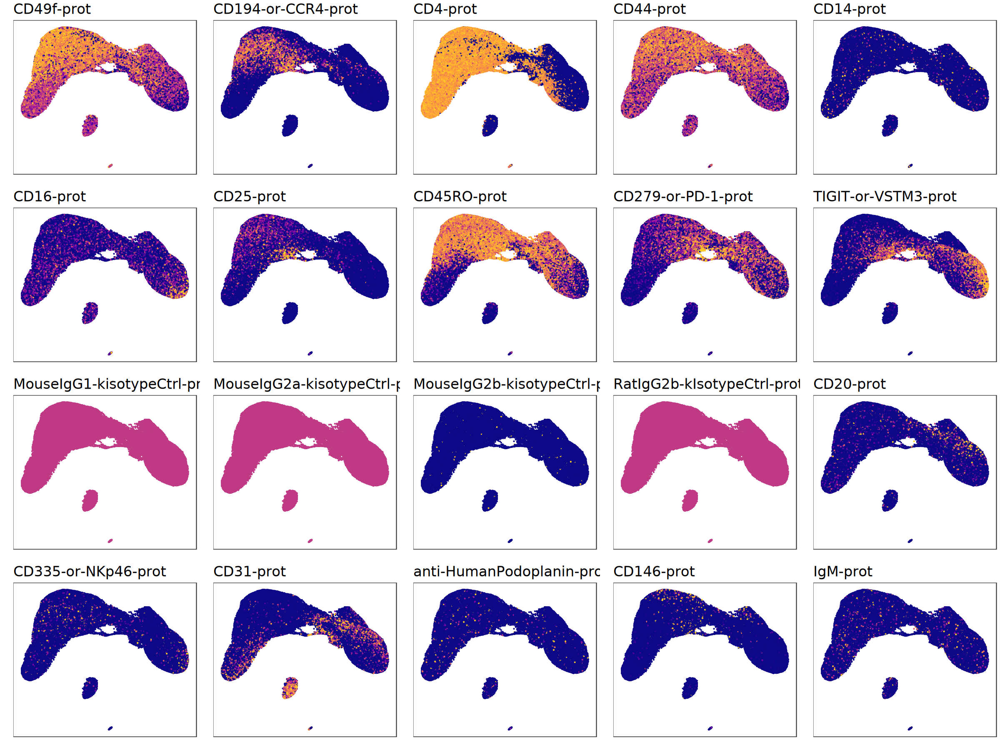

In [20]:

plot_protein <- rownames(adt_exprs_norm_filter)[21:40]

myplots <- list()
for (i in 1:length(plot_protein)) {
  gene <- plot_protein[i]
    
    max.cutoff = quantile(adt_exprs_norm_filter[gene,], .99)
    min.cutoff = quantile(adt_exprs_norm_filter[gene,], .01)

    tmp <- sapply(X = adt_exprs_norm_filter[gene,], FUN = function(x) {
        return(ifelse(test = x > max.cutoff, yes = max.cutoff,
            no = x))
    })
    tmp <- sapply(X = tmp, FUN = function(x) {
        return(ifelse(test = x < min.cutoff, yes = min.cutoff,
            no = x))
    })
  
    meta_all$gene <- as.numeric(tmp)
    

    
   ind <- paste("p", i, sep = "")
   ind <- ggplot(
                 data = meta_all[sample(nrow(meta_all)),],
#                  data = meta_all[order(meta_all$gene),] , 
                 aes(x = UMAP1_cca, y = UMAP2_cca)) + 
      geom_point(mapping = aes(color = gene), size = 0.1) + 
      scale_color_viridis(option = "plasma", end = .9) +
      labs(x="", y="")+
      theme_bw(base_size = 10)+
      theme(
        axis.text = element_blank(),
        axis.ticks = element_blank(),
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=20, face = "italic"), # face="bold.italic"
        legend.position = "none") +
      labs(title = gene)
   myplots[[i]] <- ind
    
    
}

options(repr.plot.height = 15, repr.plot.width = 20)
p <- do.call("grid.arrange", c(myplots, ncol = 5))

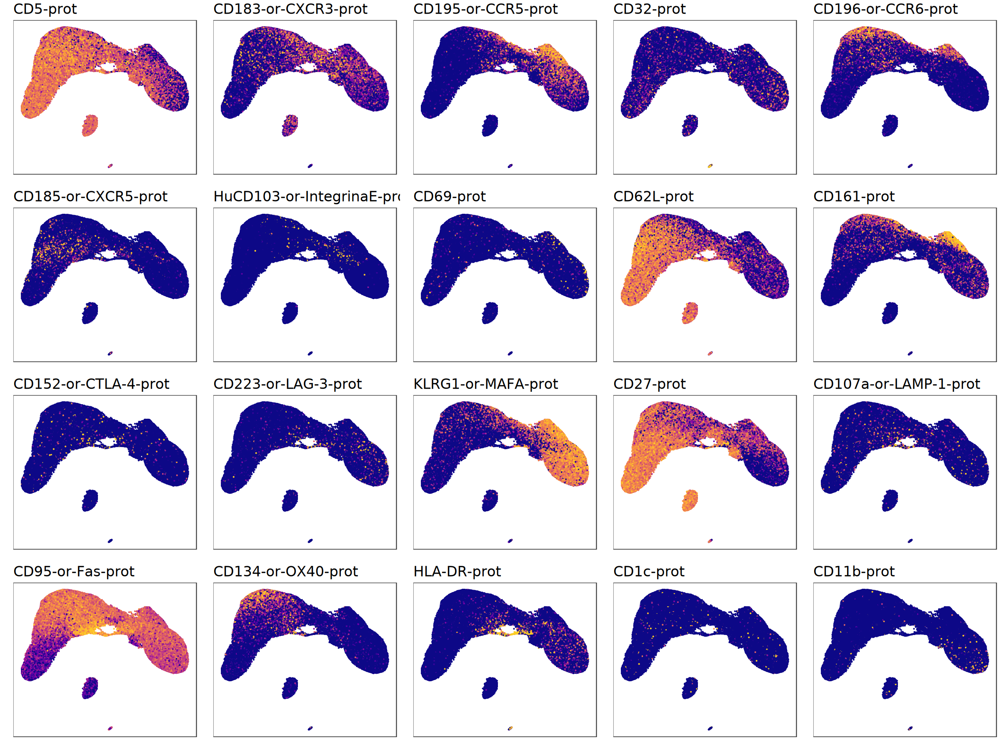

In [21]:

plot_protein <- rownames(adt_exprs_norm_filter)[41:60]

myplots <- list()
for (i in 1:length(plot_protein)) {
  gene <- plot_protein[i]
    
    max.cutoff = quantile(adt_exprs_norm_filter[gene,], .99)
    min.cutoff = quantile(adt_exprs_norm_filter[gene,], .01)

    tmp <- sapply(X = adt_exprs_norm_filter[gene,], FUN = function(x) {
        return(ifelse(test = x > max.cutoff, yes = max.cutoff,
            no = x))
    })
    tmp <- sapply(X = tmp, FUN = function(x) {
        return(ifelse(test = x < min.cutoff, yes = min.cutoff,
            no = x))
    })
  
    meta_all$gene <- as.numeric(tmp)
    

    
   ind <- paste("p", i, sep = "")
   ind <- ggplot(
                 data = meta_all[sample(nrow(meta_all)),],
#                  data = meta_all[order(meta_all$gene),] , 
                 aes(x = UMAP1_cca, y = UMAP2_cca)) + 
      geom_point(mapping = aes(color = gene), size = 0.1) + 
      scale_color_viridis(option = "plasma", end = .9) +
      labs(x="", y="")+
      theme_bw(base_size = 10)+
      theme(
        axis.text = element_blank(),
        axis.ticks = element_blank(),
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=20, face = "italic"), # face="bold.italic"
        legend.position = "none") +
      labs(title = gene)
   myplots[[i]] <- ind
    
    
}

options(repr.plot.height = 15, repr.plot.width = 20)
p <- do.call("grid.arrange", c(myplots, ncol = 5))

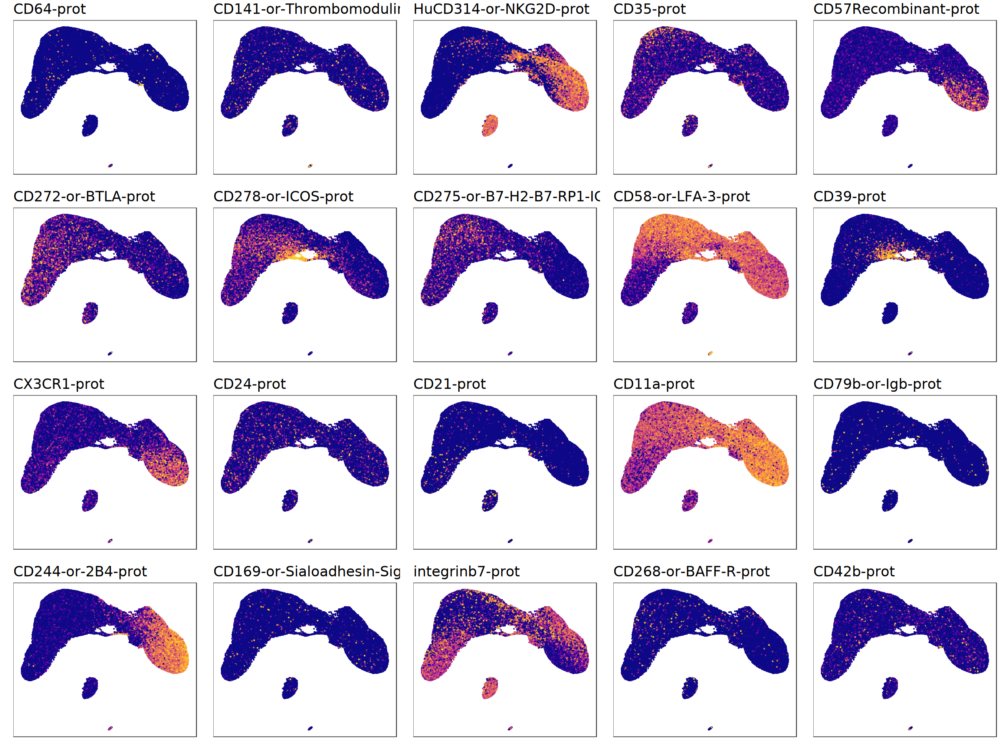

In [22]:

plot_protein <- rownames(adt_exprs_norm_filter)[61:80]

myplots <- list()
for (i in 1:length(plot_protein)) {
  gene <- plot_protein[i]
    
    max.cutoff = quantile(adt_exprs_norm_filter[gene,], .99)
    min.cutoff = quantile(adt_exprs_norm_filter[gene,], .01)

    tmp <- sapply(X = adt_exprs_norm_filter[gene,], FUN = function(x) {
        return(ifelse(test = x > max.cutoff, yes = max.cutoff,
            no = x))
    })
    tmp <- sapply(X = tmp, FUN = function(x) {
        return(ifelse(test = x < min.cutoff, yes = min.cutoff,
            no = x))
    })
  
    meta_all$gene <- as.numeric(tmp)
    

    
   ind <- paste("p", i, sep = "")
   ind <- ggplot(
                 data = meta_all[sample(nrow(meta_all)),],
#                  data = meta_all[order(meta_all$gene),] , 
                 aes(x = UMAP1_cca, y = UMAP2_cca)) + 
      geom_point(mapping = aes(color = gene), size = 0.1) + 
      scale_color_viridis(option = "plasma", end = .9) +
      labs(x="", y="")+
      theme_bw(base_size = 10)+
      theme(
        axis.text = element_blank(),
        axis.ticks = element_blank(),
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=20, face = "italic"), # face="bold.italic"
        legend.position = "none") +
      labs(title = gene)
   myplots[[i]] <- ind
    
    
}

options(repr.plot.height = 15, repr.plot.width = 20)
p <- do.call("grid.arrange", c(myplots, ncol = 5))

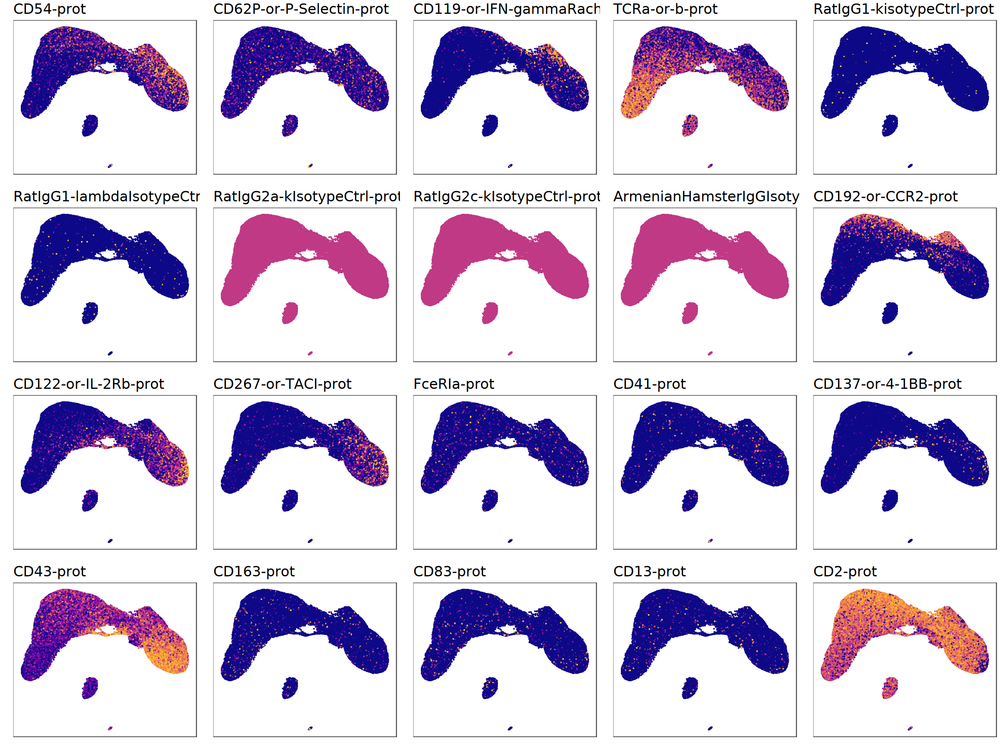

In [23]:

plot_protein <- rownames(adt_exprs_norm_filter)[81:100]

myplots <- list()
for (i in 1:length(plot_protein)) {
  gene <- plot_protein[i]
    
    max.cutoff = quantile(adt_exprs_norm_filter[gene,], .99)
    min.cutoff = quantile(adt_exprs_norm_filter[gene,], .01)

    tmp <- sapply(X = adt_exprs_norm_filter[gene,], FUN = function(x) {
        return(ifelse(test = x > max.cutoff, yes = max.cutoff,
            no = x))
    })
    tmp <- sapply(X = tmp, FUN = function(x) {
        return(ifelse(test = x < min.cutoff, yes = min.cutoff,
            no = x))
    })
  
    meta_all$gene <- as.numeric(tmp)
    

    
   ind <- paste("p", i, sep = "")
   ind <- ggplot(
                 data = meta_all[sample(nrow(meta_all)),],
#                  data = meta_all[order(meta_all$gene),] , 
                 aes(x = UMAP1_cca, y = UMAP2_cca)) + 
      geom_point(mapping = aes(color = gene), size = 0.1) + 
      scale_color_viridis(option = "plasma", end = .9) +
      labs(x="", y="")+
      theme_bw(base_size = 10)+
      theme(
        axis.text = element_blank(),
        axis.ticks = element_blank(),
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=20, face = "italic"), # face="bold.italic"
        legend.position = "none") +
      labs(title = gene)
   myplots[[i]] <- ind
    
    
}

options(repr.plot.height = 15, repr.plot.width = 20)
p <- do.call("grid.arrange", c(myplots, ncol = 5))

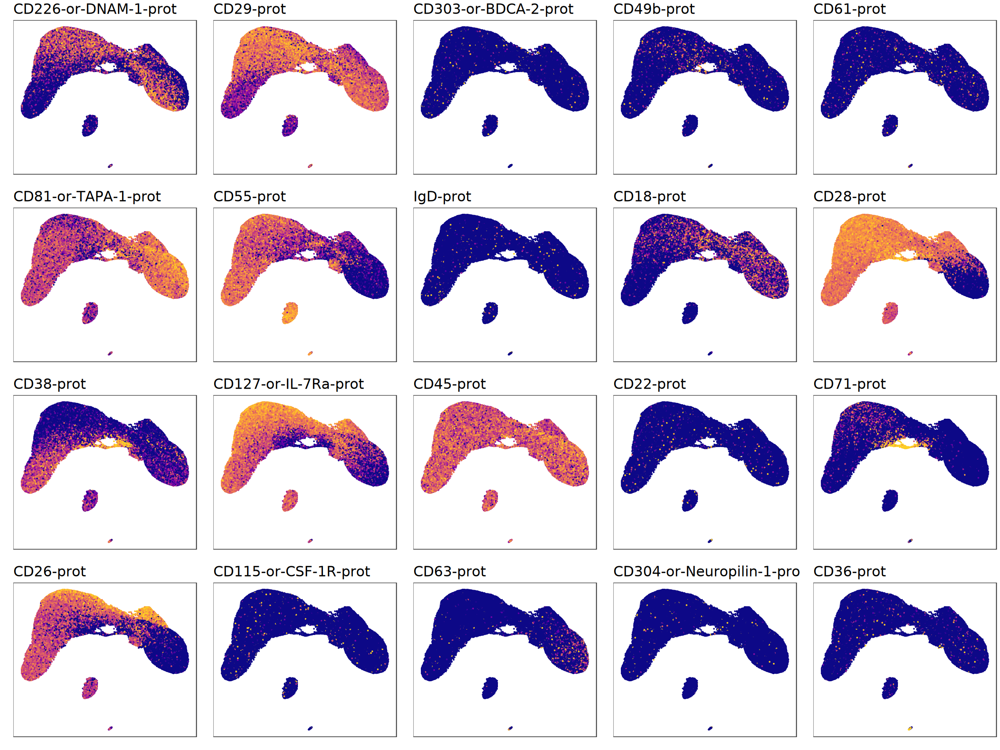

In [24]:

plot_protein <- rownames(adt_exprs_norm_filter)[101:120]

myplots <- list()
for (i in 1:length(plot_protein)) {
  gene <- plot_protein[i]
    
    max.cutoff = quantile(adt_exprs_norm_filter[gene,], .99)
    min.cutoff = quantile(adt_exprs_norm_filter[gene,], .01)

    tmp <- sapply(X = adt_exprs_norm_filter[gene,], FUN = function(x) {
        return(ifelse(test = x > max.cutoff, yes = max.cutoff,
            no = x))
    })
    tmp <- sapply(X = tmp, FUN = function(x) {
        return(ifelse(test = x < min.cutoff, yes = min.cutoff,
            no = x))
    })
  
    meta_all$gene <- as.numeric(tmp)
    

    
   ind <- paste("p", i, sep = "")
   ind <- ggplot(
                 data = meta_all[sample(nrow(meta_all)),],
#                  data = meta_all[order(meta_all$gene),] , 
                 aes(x = UMAP1_cca, y = UMAP2_cca)) + 
      geom_point(mapping = aes(color = gene), size = 0.1) + 
      scale_color_viridis(option = "plasma", end = .9) +
      labs(x="", y="")+
      theme_bw(base_size = 10)+
      theme(
        axis.text = element_blank(),
        axis.ticks = element_blank(),
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=20, face = "italic"), # face="bold.italic"
        legend.position = "none") +
      labs(title = gene)
   myplots[[i]] <- ind
    
    
}

options(repr.plot.height = 15, repr.plot.width = 20)
p <- do.call("grid.arrange", c(myplots, ncol = 5))

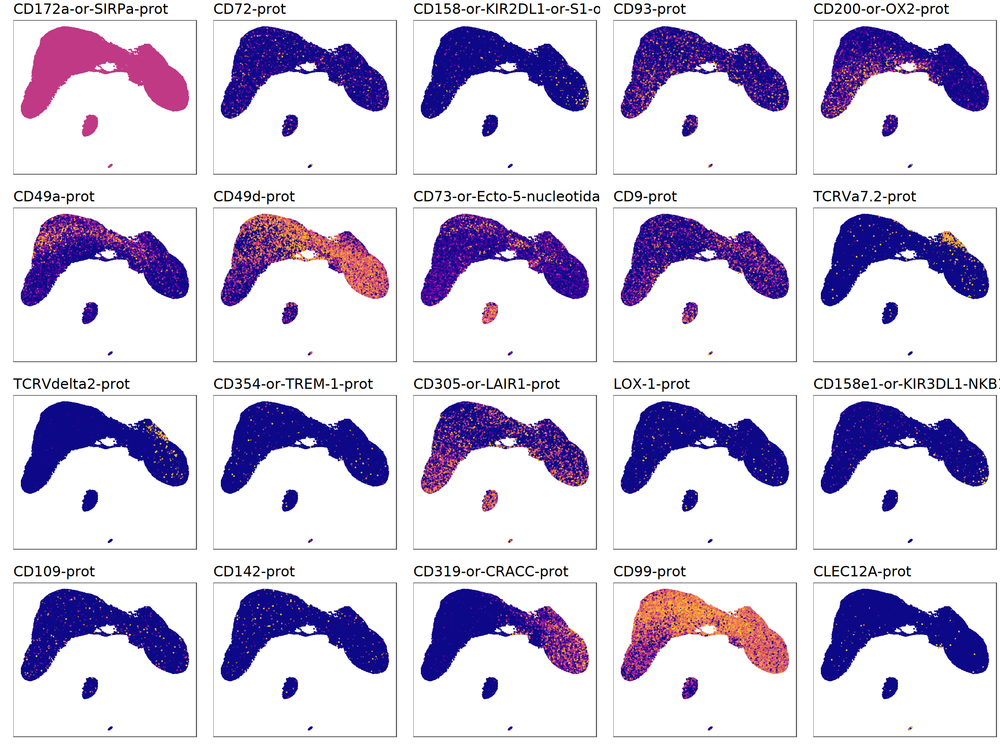

In [25]:

plot_protein <- rownames(adt_exprs_norm_filter)[121:140]

myplots <- list()
for (i in 1:length(plot_protein)) {
  gene <- plot_protein[i]
    
    max.cutoff = quantile(adt_exprs_norm_filter[gene,], .99)
    min.cutoff = quantile(adt_exprs_norm_filter[gene,], .01)

    tmp <- sapply(X = adt_exprs_norm_filter[gene,], FUN = function(x) {
        return(ifelse(test = x > max.cutoff, yes = max.cutoff,
            no = x))
    })
    tmp <- sapply(X = tmp, FUN = function(x) {
        return(ifelse(test = x < min.cutoff, yes = min.cutoff,
            no = x))
    })
  
    meta_all$gene <- as.numeric(tmp)
    

    
   ind <- paste("p", i, sep = "")
   ind <- ggplot(
                 data = meta_all[sample(nrow(meta_all)),],
#                  data = meta_all[order(meta_all$gene),] , 
                 aes(x = UMAP1_cca, y = UMAP2_cca)) + 
      geom_point(mapping = aes(color = gene), size = 0.1) + 
      scale_color_viridis(option = "plasma", end = .9) +
      labs(x="", y="")+
      theme_bw(base_size = 10)+
      theme(
        axis.text = element_blank(),
        axis.ticks = element_blank(),
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=20, face = "italic"), # face="bold.italic"
        legend.position = "none") +
      labs(title = gene)
   myplots[[i]] <- ind
    
    
}

options(repr.plot.height = 15, repr.plot.width = 20)
p <- do.call("grid.arrange", c(myplots, ncol = 5))

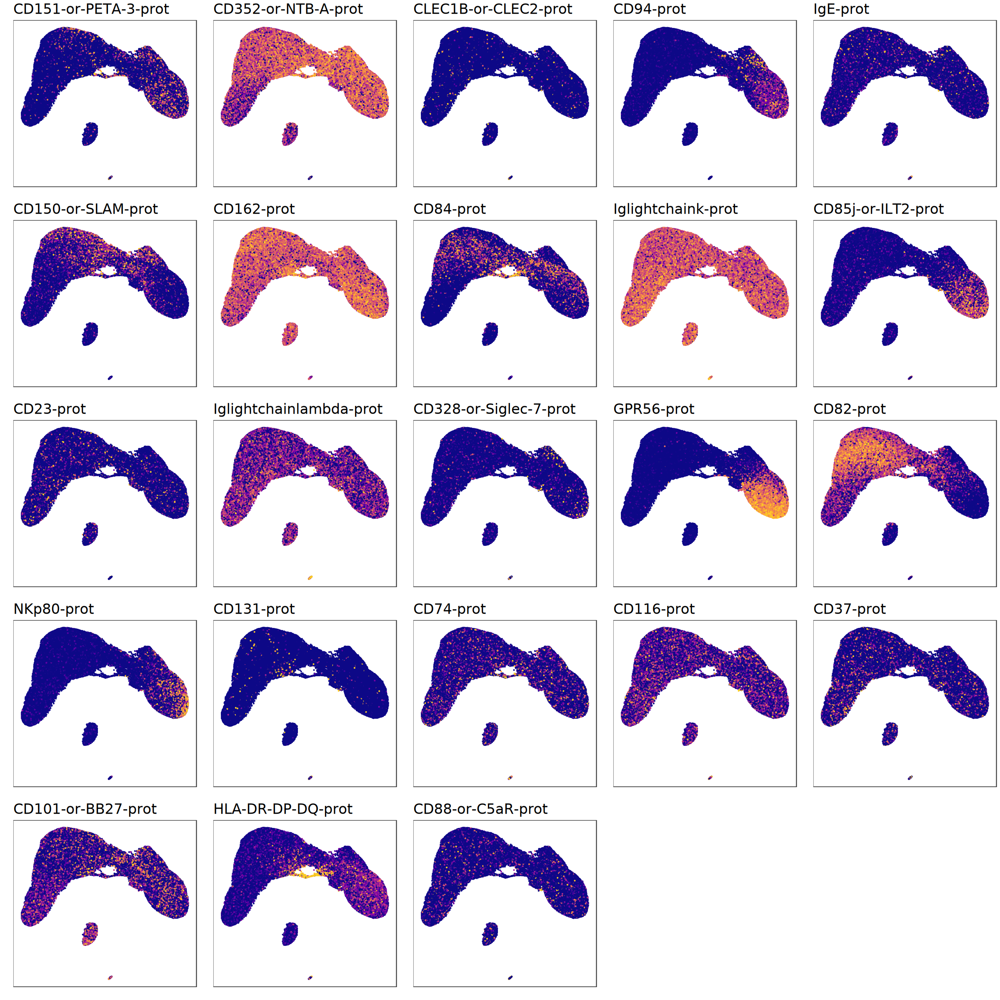

In [26]:

plot_protein <- rownames(adt_exprs_norm_filter)[141:nrow(adt_exprs_norm_filter)]

myplots <- list()
for (i in 1:length(plot_protein)) {
  gene <- plot_protein[i]
    
    max.cutoff = quantile(adt_exprs_norm_filter[gene,], .99)
    min.cutoff = quantile(adt_exprs_norm_filter[gene,], .01)

    tmp <- sapply(X = adt_exprs_norm_filter[gene,], FUN = function(x) {
        return(ifelse(test = x > max.cutoff, yes = max.cutoff,
            no = x))
    })
    tmp <- sapply(X = tmp, FUN = function(x) {
        return(ifelse(test = x < min.cutoff, yes = min.cutoff,
            no = x))
    })
  
    meta_all$gene <- as.numeric(tmp)
    

    
   ind <- paste("p", i, sep = "")
   ind <- ggplot(
                 data = meta_all[sample(nrow(meta_all)),],
#                  data = meta_all[order(meta_all$gene),] , 
                 aes(x = UMAP1_cca, y = UMAP2_cca)) + 
      geom_point(mapping = aes(color = gene), size = 0.1) + 
      scale_color_viridis(option = "plasma", end = .9) +
      labs(x="", y="")+
      theme_bw(base_size = 10)+
      theme(
        axis.text = element_blank(),
        axis.ticks = element_blank(),
        panel.grid = element_blank(),
        plot.title = element_text(color="black", size=20, face = "italic"), # face="bold.italic"
        legend.position = "none") +
      labs(title = gene)
   myplots[[i]] <- ind
    
    
}

options(repr.plot.height = 20, repr.plot.width = 20)
p <- do.call("grid.arrange", c(myplots, ncol = 5))

## Run StabMap to integrate Mass cytometry and CITE-seq

In [ ]:
# scripts/AMP_RASLE/StabMap_*.sh

stab_indirect = readRDS(paste0("/pl/active/fanzhanglab/jinamo/AMP_RASLE/Phase2/data/CITEseq/StabMap_Obj_",celltype,".rds"))
head(rownames(stab_indirect))
cell_id = rownames(stab_indirect)
stab_indirect %<>% dplyr::rename(clu_name = cluster) %>%
    dplyr::left_join(.,cluster_df,by="clu_name") %>%
    magrittr::set_rownames(cell_id) %>%
    dplyr::mutate(dataset = stringr::str_split(rownames(.),pattern=":",simplify=TRUE)[,1])

meta_all = readRDS(paste0("/pl/active/fanzhanglab/jinamo/AMP_RASLE/Phase2/data/CITEseq/qc_mRNA_protein_cca_pca_harmony_umap_clus_meta_all_",celltype,".rds"))
meta_all = meta_all[,-c(21:40, 48:67, 75:94)]


meta_all$clu_name = stab_indirect[stab_indirect$dataset == "CITEseq",]$clu_name
meta_all$cluster = stab_indirect[stab_indirect$dataset == "CITEseq",]$cluster
meta_all$UMAP1_stab = stab_indirect[stab_indirect$dataset == "CITEseq",]$UMAP1
meta_all$UMAP2_stab = stab_indirect[stab_indirect$dataset == "CITEseq",]$UMAP2

### CITE-seq

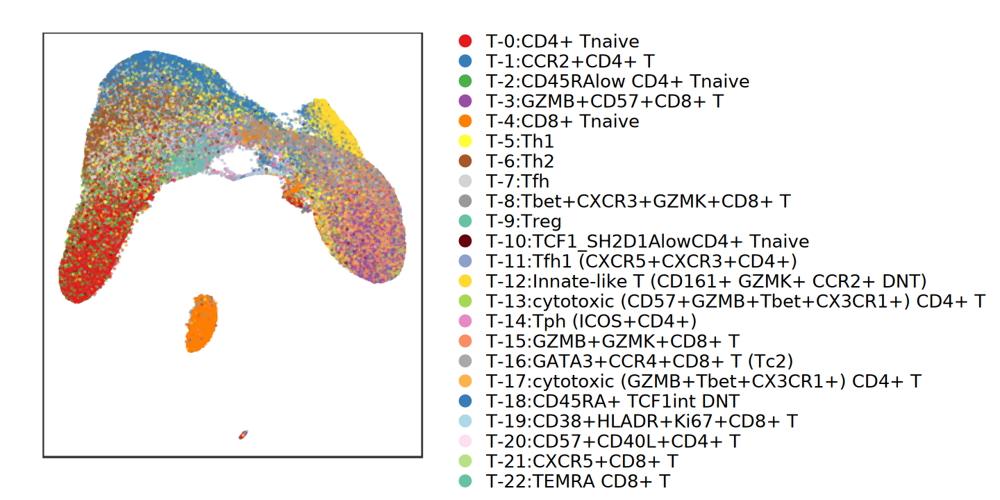

In [ ]:
options(repr.plot.height = 6, repr.plot.width = 12)
set.seed(1234)
# png(paste0("/projects/jinamo@xsede.org/cytof/results/T_cells/Clustering_neighbors",n_neighbors,"_mindist",min_dist,"_res",resolution_list,"_cluster.png"), width = 1400, height = 1400,res=360)
plot(ggplot() +
       geom_point(
         data = data.frame(stab_indirect[stab_indirect$dataset=="CITEseq",] %>% 
                               dplyr::mutate(cluster = factor(cluster,levels=cluster_df$cluster)) %>%
                               dplyr::select(-c(UMAP1,UMAP2)),
                           UMAP1 = meta_all$UMAP1_cca,
                           UMAP2 = meta_all$UMAP2_cca) %>% dplyr::sample_frac(1),
         mapping = aes_string(x = "UMAP1", y = "UMAP2", color = "cluster"),
         size = 1, stroke = 0, shape = 16, alpha = 0.5
       ) +
       scale_colour_manual(labels = paste0(celltype,"-",cluster_df$cluster,":",cluster_df$clu_name),
                           values = c(
                             "0" = "#E41A1C",
                             "1" = "#377EB8",
                             "2" = "#4DAF4A",
                             "3" = "#984EA3",
                             "4" = "#FF7F00",
                             "5" = "#FFFF33",
                             "6" = "#A65628",
                             "7" = "lightgrey",
                             "8" = "#999999",
                             "9" = "#66C2A5",
                             "10" = "#67000D",
                             "11" = "#8DA0CB",
                             "12" = "#FFD92F",
                             "13" = "#A6D854",
                             "14" = "#E78AC3",
                             "15" = "#FC8D62",
                             "16" = "darkgrey",
                             "17" = "#FEB24C",
                             "18" = "#377EB8",
                             "19" = "lightblue",
                             "20" = "#FDE0EF",
                             "21" = "#B8E186",
                             "22" = "#66C2A5",
                             "23" = "#A6D855",
                             "24" = "#E78AC4",
                             "25" = "#FC8D63",
                             "26" = "brown",
                             "27" = "#FEB25C",
                             "28" = "#377EB9",
                             "29" = "lightgreen",
                             "30" = "#FDE1EF"
                           )) +
       labs(
         x = "",
         y = "",
         title = ""
       ) +
       theme_bw(base_size = 19) +
       theme(
         legend.position = "right",
         axis.text = element_blank(),
         axis.ticks = element_blank(),
         panel.grid = element_blank(),
         plot.title = element_text(color="black", size=10)
       ) + guides(colour = guide_legend(override.aes = list(size=5, alpha = 1),
                                        title = "",
                                        ncol = 1))
)


In [ ]:
clus = c("0","1","5","6","7","9","14") # CD4 T cells

## Heatmap of marker genes
marker_plot <- unique(markers)

exp_heat <- exprs_norm[marker_plot,]
exp_heat <- t(exp_heat)
exp_heat <- as.data.frame(as.matrix(exp_heat))
exp_heat$res_cell <- paste0(celltype,"-",meta_all$cluster,":",meta_all$clu_name)
exp_heat <- exp_heat[exp_heat$res_cell %in% paste0(celltype,"-",meta_all[meta_all$cluster %in% clus, ]$cluster,":",meta_all[meta_all$cluster %in% clus, ]$clu_name), ]
exp_heat$res_cell <- paste0(meta_all[meta_all$cluster %in% clus, ]$clu_name)

exp_ave <- aggregate(exp_heat[, 1:(ncol(exp_heat)-1)], list(exp_heat$res_cell), mean)
colnames(exp_ave)[1] <- "res_cell"
exp_ave <- as.data.frame(t(exp_ave))
colnames(exp_ave) <- as.character(t(exp_ave[1,]))
exp_ave <- exp_ave[-1,]
row_names <- rownames(exp_ave)
exp_ave <- mutate_all(exp_ave, function(x) as.numeric(as.character(x)))
rownames(exp_ave) <- row_names               
head(exp_ave)
dim(exp_ave)     
                      
# Overwrite default draw_colnames in the pheatmap package.
# Thanks to Josh O'Brien at http://stackoverflow.com/questions/15505607
draw_colnames_45 <- function (coln, gaps, ...) {
  coord <- pheatmap:::find_coordinates(length(coln), gaps)
  x     <- coord$coord - 0.5 * coord$size
  res   <- grid::textGrob(
    coln, x = x, y = unit(1, "npc") - unit(3,"bigpts"),
    vjust = 0.75, hjust = 1, rot = 45, gp = grid::gpar(...)
  )
  return(res)
}
assignInNamespace(
  x = "draw_colnames",
  value = "draw_colnames_45",
  ns = asNamespace("pheatmap")
)
exp_ave <- as.matrix(exp_ave)
mat_breaks <- seq(min(exp_ave), max(exp_ave), length.out = 10)
quantile_breaks <- function(xs, n = 10) {
  breaks <- quantile(xs, probs = seq(0, 1, length.out = n))
  breaks[!duplicated(breaks)]
}

mat_breaks <- quantile_breaks(exp_ave, n = 20)
scale_rows <- function(x) t(scale(t(x)))
exp_ave_scale <- scale_rows(exp_ave) # Z-score
exp_ave_scale<- na.omit(exp_ave_scale)
mat_breaks <- quantile_breaks(exp_ave_scale, n = 10)
mat_breaks <- seq(min(exp_ave_scale), max(exp_ave_scale), length.out = 24)
mat_breaks <- quantile_breaks(exp_ave_scale, n = 6)
mat_breaks <- seq(min(exp_ave_scale), max(exp_ave_scale), length.out = 24)
exp_ave_scale[exp_ave_scale > 2] <- 2
exp_ave_scale[exp_ave_scale < -2] <- -2
head(exp_ave_scale)
dim(exp_ave_scale)

,CCR2+CD4+ T,CD4+ Tnaive,Tfh,Th1,Th2,Tph (ICOS+CD4+),Treg
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CCR2,0.1279225890,4.425753e-03,1.231025e-02,0.0212699840,0.0167937390,0.0863555670,0.018183845
CCR6,0.2594200640,2.440575e-03,1.791856e-01,0.0606255630,0.0965217060,0.1139798320,0.162403710
KLRB1,1.2109223600,5.221058e-02,1.194139e+00,0.3563230500,0.1961298300,0.6427196900,0.231052170
IL23R,0.0146902229,0.000000e+00,6.491932e-03,0.0008208315,0.0021156461,0.0030719999,0.001022191
IL22,0.0008356994,0.000000e+00,7.360722e-05,0.0000000000,0.0006188396,0.0001049138,0.000000000
IL21,0.0001677423,3.736735e-05,2.297709e-03,0.0003735694,0.0001472646,0.0156124500,0.002877464


[1] 17  7

,CCR2+CD4+ T,CD4+ Tnaive,Tfh,Th1,Th2,Tph (ICOS+CD4+),Treg
CCR2,1.8475604,-0.7785240,-0.6108649,-0.4203417,-0.5155264,0.9636632,-0.48596660
CCR6,1.5978442,-1.4554848,0.6445295,-0.7641537,-0.3376499,-0.1302193,0.44513409
KLRB1,1.3719097,-1.0508278,1.3368181,-0.4149625,-0.7499087,0.1838611,-0.67688995
IL23R,2.0000000,-0.7808001,0.4768659,-0.6217825,-0.3709412,-0.1856691,-0.58277369
IL22,1.7428744,-0.6749655,-0.4620056,-0.6749655,1.1154571,-0.3714296,-0.67496547
IL21,-0.5144786,-0.5375632,-0.1373403,-0.4780342,-0.5181045,2.0000000,-0.03468712


[1] 17  7

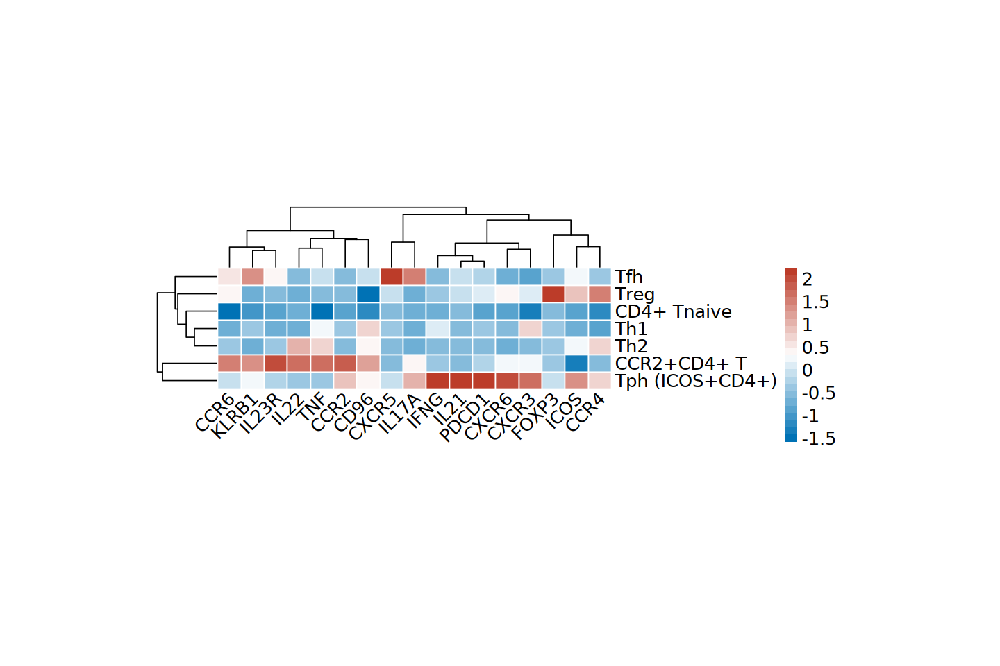

In [ ]:

options(repr.plot.height = 8, repr.plot.width = 12)

    pheatmap(
      mat =scale(t(exp_ave))[,colnames(t(exp_ave))[colVars(t(exp_ave))!=0]],
      border_color = "white",
      #breaks  = mat_breaks,
      #color  =inferno(length(mat_breaks) - 1),
      color= colorRampPalette(c('#0072B5FF', "white", '#BC3C29FF'))(length(mat_breaks)),
      show_rownames = TRUE,
      show_colnames = TRUE,
      cluster_rows = TRUE,
      cluster_cols = TRUE,
      show_row_dend = FALSE,show_column_dend = FALSE, 
      fontsize = 15,
      fontsize_row = 15,
      cellwidth = 20, cellheight = 15, 
      width = 5, height=4.5,
      scale = "none",
      legend = TRUE
    )

